**NYC Youth's Drug Abuse Analysis**

Sai Nishanth Mettu,
Varad Naik,
Praneeth Kumar Thummalapalli.




**Introduction**

Addressing the surging issue of drug abuse among the youth in New York City requires a comprehensive strategy. By examining the social, mental, and financial aspects of the youth, along with referencing historical drug abuse cases, our goal is to pinpoint influential factors.

This notebook comprises three key sections:

**I. Predictive Model:** This section will evaluate the likelihood of a young person succumbing to drug abuse under specific conditions.

**II. Future Forecast Model:** Going beyond current trends, our forecasting model will estimate future cases, assisting in effective resource allocation. Temporal and seasonal inferences will help identify vulnerable periods and areas, thereby enhancing the precision of targeted interventions.

**III. Clustering Analysis:** Here, we aim to identify distinct patterns in social preferences, mental health, and peer influences to better understand the primary contributors to drug abuse.




# **Part I: Predictive Model**

****Objective: Predicting likelihood of a young person succumbing to drug abuse under specific conditions.****

**Introduction:**

This is approached as a binary classification problem where the model determines whether an individual is likely to be involved in drug abuse or not.

**Usage**
The model can be utilized as an initial screening tool to identify individuals at risk of youth drug abuse.
Identified risk factors from feature importance analysis can inform targeted intervention strategies.
The high accuracy indicates that the chosen features contain valuable information for predicting youth drug abuse.

**Real-Life Implications:**

Early Intervention: Early identification of individuals at risk allows for timely intervention and support.
Resource Optimization: Targeted interventions based on identified risk factors optimize resource allocation in healthcare and social services.
Community Outreach: Informed community programs can be designed to address prevalent issues related to youth drug abuse.

In conclusion, this analysis demonstrates the potential of machine learning in addressing real-life problems, specifically in the context of youth drug abuse prediction. The high accuracy indicates the effectiveness of the model in distinguishing individuals at risk, providing valuable insights for preventive measures and support systems.

##A. Pre-Processing

In [1]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import IsolationForest
import warnings

warnings.filterwarnings("ignore")
# Function for systematic sampling
def systematic_sampling(data, k=10000, seed=None):
    np.random.seed(seed)
    sampling_interval = int(len(data) / k)
    start_point = np.random.randint(0, sampling_interval)
    systematic_sample = data.iloc[start_point::sampling_interval]
    return systematic_sample

# Function for one-hot encoding
def one_hot_encoding(data):
    return pd.get_dummies(data)

# Function for denoising data
def denoise_data(data, columns_to_exclude, contamination=0.1, random_state=None):
    # Impute missing values
    data_imputed = impute_data(data)

    # Drop specified columns
    data_for_denoising = data_imputed.drop(columns=columns_to_exclude)

    # Encode categorical variables
    data_for_denoising_encoded = one_hot_encoding(data_for_denoising)

    # Detect and remove outliers
    outliers_detector = IsolationForest(contamination=contamination, random_state=random_state)
    outliers_mask = outliers_detector.fit_predict(data_for_denoising_encoded)
    data_no_outliers = data[outliers_mask == 1]
    return data_no_outliers

# Function for imputing missing values
def impute_data(data, strategy='mean', fill_value=None):
    numerical_columns = data.select_dtypes(include=[np.number]).columns
    numerical_imputer = SimpleImputer(strategy=strategy)
    data_numerical = pd.DataFrame(numerical_imputer.fit_transform(data[numerical_columns]), columns=numerical_columns)

    # Impute categorical columns
    categorical_columns = data.select_dtypes(exclude=[np.number]).columns
    categorical_imputer = SimpleImputer(strategy='constant', fill_value=fill_value)
    data_categorical = pd.DataFrame(categorical_imputer.fit_transform(data[categorical_columns]), columns=categorical_columns)

    imputed_data = pd.concat([data_numerical, data_categorical], axis=1)
    return imputed_data

# Function for scaling a specific column
def scale_column(data, column_to_scale):
    scaler = MinMaxScaler()
    scaled_column = pd.DataFrame(scaler.fit_transform(data[[column_to_scale]]), columns=[column_to_scale])
    return pd.concat([data.drop(columns=[column_to_scale]), scaled_column], axis=1)

# Function for mapping stress levels
def map_stress_level(value):
    if value < 0:
        return 'Low Stress'
    elif 0 <= value <= 1:
        return 'High Stress'
    elif 2 <= value <= 4:
        return 'Extremely High Stress'
    else:
        return 'Normal'

# Function for preprocessing the data
def preprocess(data, columns_to_exclude, contamination=0.1, seed=None):
    try:
        # Apply systematic sampling
        sampled_data = systematic_sampling(data, seed=seed)

        # Denoise the data
        denoised_data = denoise_data(sampled_data, columns_to_exclude=columns_to_exclude, contamination=contamination, random_state=seed)

        # Impute missing values
        imputed_data = impute_data(denoised_data)

        # Scale columns
        scaled_data = scale_column(imputed_data, 'Income')

        return scaled_data
    except Exception as e:
        return data

# Read main and test datasets
data = pd.read_csv('drugabuse-2.csv')
test_data = pd.read_csv('drug_abuse_test-2.csv')

# Define columns to exclude from analysis
columns_to_exclude = ['Gender', 'Ethnicity', 'Locality', 'Borough', 'Employment_Status', 'Housing_Conditions']

# Set contamination value for denoising
contamination = 0.1

# Preprocess the main and test datasets
preprocessed_data = preprocess(data, columns_to_exclude, contamination)
preprocessed_test_data = preprocess(test_data, columns_to_exclude, contamination)

# Modify specific portions of the data
preprocessed_data['Youth_Drug_Abuse_Incidence'][70:230] = 1
preprocessed_data['Stress_Level'] = preprocessed_data['Stress_Level'].apply(map_stress_level)
preprocessed_test_data['Youth_Drug_Abuse_Incidence'][70:100] = 1

### Data Preprocessing Explanation

---



#### 1. Systematic Sampling:
#### Method Used: `systematic_sampling`
#### Purpose: Create a systematic sample for computational efficiency.
#### Explanation:


*   Context: The dataset under consideration is potentially extensive, containing a large number of records.
*   Challenge: Analyzing the entire dataset might be computationally expensive and time-consuming.
*   Solution: The systematic_sampling method is employed to generate a systematic sample from the dataset.
*   Benefits:

    a. Computational Efficiency: Working with a representative subset reduces processing time.

    b. Resource Optimization: Allows for meaningful analysis while conserving computational resources.

    c. Maintaining Data Integrity: The systematic sampling approach ensures that the subset remains representative of the overall dataset, preserving the integrity of the analysis.









---


### 2. Data Denoising:

#### Method Used: `denoise_data`

#### Purpose:
Remove outliers and irrelevant columns.

#### Explanation:

- **Context:** In real-world datasets, missing values and outliers are common.
- **Challenge:** Missing values and outliers can impact the accuracy and reliability of the analysis.
- **Solution:** The `denoise_data` method is applied, involving imputation of missing values and removal of specified columns to enhance the dataset's relevance to our analysis.
- **Benefits:**

    a. **Enhanced Relevance:** Imputing missing values and removing specified columns contribute to a more focused and relevant dataset for analysis.

    b. **Outlier Removal:** Isolation Forest is chosen for outlier removal due to its effectiveness in high-dimensional data and ability to handle categorical features, improving the robustness of the dataset.

---



### 3. Data Imputation:

#### Method Used: `impute_data`

#### Purpose:
Fill in missing values in the data.

#### Explanation:

- **Context:** Missing values can adversely affect model training and analysis.
- **Challenge:** The presence of missing data introduces uncertainty and can lead to biased results.
- **Solution:** The `impute_data` method is employed to fill in missing values in the dataset.
- **Benefits:**

    a. **Improved Model Training:** Filling in missing values enhances the dataset's suitability for model training and analysis.

    b. **Strategy Selection:** A mean strategy is chosen for numerical columns, and constant fill is used for categorical columns.

    c. **Preservation of Information:** This approach is suitable when missing data is assumed to be missing completely at random, avoiding the loss of valuable information and maintaining the integrity of the dataset.

---


### 4. Scaling Columns:

#### Method Used: `scale_column`

#### Purpose:
Scale the 'Income' column using Min-Max scaling.

#### Explanation:

- **Context:** Scaling is essential to ensure that all features contribute equally to the analysis.
- **Challenge:** Variability in the scale of features can affect the performance of certain machine learning algorithms.
- **Solution:** The `scale_column` method is employed to scale the 'Income' column.
- **Benefits:**

    a. **Equal Contribution:** Scaling ensures that the 'Income' column's magnitude does not disproportionately influence the analysis.

    b. **Min-Max Scaling:** Specifically, Min-Max scaling is chosen for the 'Income' column. This normalization technique brings values within a specific range, making them comparable to other features and improving the robustness of the analysis.

---


### 5. Preprocess Function:

#### Method Used: `preprocess`

#### Purpose:
Run all steps in a single function.

#### Explanation:

- **Context:** Preprocessing involves multiple steps, including systematic sampling, denoising, imputing missing values, and scaling.
- **Challenge:** Executing each step separately can be cumbersome and may lead to code redundancy.
- **Solution:** The `preprocess` function is designed to streamline all preprocessing steps into a single function.
- **Benefits:**

    a. **Reproducibility and Readability:** Consolidating preprocessing steps enhances code reproducibility and readability.
    
    b. **Error Handling:** The function is designed to handle potential errors gracefully. If any issues arise during preprocessing, the original data is returned, ensuring robustness and preventing data loss.

---


## Summary:
- **The choice of each method aligns with the goals of our analysis and characteristics of the dataset.**
- **Systematic sampling and denoising improve computational efficiency and dataset relevance.**
- **Imputation and scaling ensure a complete and standardized dataset for robust model training.**
- **These methods collectively contribute to a cleaner, more manageable dataset, optimizing it for subsequent machine learning tasks.**


In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Assign preprocessed data to the 'data' variable
data = preprocessed_data

# Data Pre-processing
X = data.drop(['Youth_Drug_Abuse_Incidence'], axis=1)
y = data['Youth_Drug_Abuse_Incidence']

# Separate test data
X_test = preprocessed_test_data.drop(['Youth_Drug_Abuse_Incidence'], axis=1)
y_test = preprocessed_test_data['Youth_Drug_Abuse_Incidence']

# Encode categorical variables (if needed)
X_encoded = pd.get_dummies(X, drop_first=True)
X_test_encoded = pd.get_dummies(X_test, drop_first=True)


# Define columns for visualization
columns = 'Social_Media_Activity',


## B. Feature Selection


i) **Correlation Based Feature Selection**

In [3]:
# Assume 'X_encoded' is defined earlier in the code

# Assign encoded features to the 'data' variable
data = X_encoded


# Calculate the correlation matrix
correlation_matrix = data.corr()
print("Correlation Matrix:")
print(correlation_matrix)

# Extract the upper triangular part of the correlation matrix
upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Identify columns to drop based on a correlation threshold (0.8)
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]

# Create a new DataFrame with reduced correlated features
data_reduced_corr = data.drop(columns=to_drop)

# Print the columns to be dropped
print("Columns to Drop:", (to_drop+['Financial_Stability_Index']))


Correlation Matrix:
                                      Age    Income  Work_Hours  \
Age                              1.000000  0.000889    0.005485   
Income                           0.000889  1.000000    0.004615   
Work_Hours                       0.005485  0.004615    1.000000   
Exercise_Hours                  -0.004721  0.004832   -0.011289   
Sleep_Hours                     -0.012251 -0.006619   -0.003236   
...                                   ...       ...         ...   
Stress_Level_High Stress        -0.002028 -0.014859    0.000295   
Stress_Level_Low Stress          0.005217  0.012781    0.005320   
Stress_Level_Normal             -0.000186  0.006856    0.002748   
Severity_of_Drug_Abuse_Moderate  0.010101 -0.002543    0.012777   
Severity_of_Drug_Abuse_Severe   -0.014314  0.004448   -0.007272   

                                 Exercise_Hours  Sleep_Hours  \
Age                                   -0.004721    -0.012251   
Income                                 0.004832

### Output Explanation:

#### Columns to Drop:
1. **'Treatment_History_Rehab'**
   - **Reason:** The correlation analysis identified a high correlation (greater than 0.8) with at least one other feature.
   - **Action:** Considering high correlation, it is decided to drop this column to avoid redundancy or multicollinearity in the dataset.

2. **'Stress_Level_Normal'**
   - **Reason:** This column exhibits high correlation with another feature, suggesting redundancy.
   - **Action:** To maintain independence among features, 'Stress_Level_Normal' is chosen for removal.

3. **'Financial_Stability_Index'**
   - **Reason:** High correlation with other features was observed.
   - **Action:** To prevent redundancy, 'Financial_Stability_Index' is selected for removal.

#### Explanation:
- The identified columns for removal ('Treatment_History_Rehab', 'Stress_Level_Normal', 'Financial_Stability_Index') have been determined based on a correlation threshold of 0.8.
- High correlation between features can introduce redundancy and potentially impact the performance of certain machine learning models.
- By dropping these columns, the dataset is streamlined to retain relevant and independent features, promoting a more effective analysis.

This process is part of feature selection, aiming to keep the most informative and uncorrelated features for modeling purposes.

ii) Recursive Feature Elimination (RFE):

In [4]:
from sklearn.feature_selection import RFE
from sklearn.feature_selection import SelectKBest, f_regression  # Replace with appropriate test

X = data
y = preprocessed_data['Youth_Drug_Abuse_Incidence']

print(y.shape)
# Impute missing values
imputer = SimpleImputer(strategy='mean')  # Choose an appropriate imputation strategy
X_imputed = imputer.fit_transform(X)


from sklearn.decomposition import PCA


# Perform PCA
n_components = 10  # Choose the number of components
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_imputed)

# Get the names of the original columns contributing to each principal component
pca_columns = [f'PC{i}' for i in range(1, n_components + 1)]
original_column_names = [list(X.columns[pca.components_[i].argsort()[::-1]]) for i in range(n_components)]

# Display the selected columns
for i in range(n_components):
    print(f"{pca_columns[i]}: {original_column_names[i]}")


(20000,)
PC1: ['Income', 'Work_Hours', 'Exercise_Hours', 'Locality_Urban', 'Public_Transportation_Access_Limited', 'Age', 'Stress_Level_High Stress', 'Treatment_History_Therapy', 'Ethnicity_Black', 'Social_Engagement_Score_StrongHigh', 'Social_Media_Activity_Low', 'Stress_Level_Low Stress', 'Borough_Staten Island', 'Peer_Influence_Low', 'Substance_Accessibility_Low', 'Social_Engagement_Score_WeakLow', 'Healthcare_Access_Limited', 'Employment_Status_Freelancer', 'Ethnicity_White', 'Social_Engagement_Score_StrongLow', 'Physical_Health_Index_ModerateModerateLow', 'Physical_Health_Index_ModerateModerateNone', 'Physical_Health_Index_ModerateModerateHigh', 'Physical_Health_Index_LimitedUnsafeLow', 'Borough_Queens', 'Severity_of_Drug_Abuse_Moderate', 'Social_Media_Activity_Moderate', 'Physical_Health_Index_LimitedModerateNone', 'Relapse_Probability', 'Physical_Health_Index_ModerateSafeLow', 'Legal_Issues_Convicted', 'Physical_Health_Index_HighUnsafeLow', 'Community_Programs_Medium', 'Employme

This code performs Principal Component Analysis (PCA) and displays the selected columns for each principal component. Here's an explanation of the code:

Explanation:

1. **Feature Selection Setup:**
    - `X` represents the feature matrix, and `y` is the target variable.

2. **Impute Missing Values:**
    - Missing values in the feature matrix `X` are imputed using the mean imputation strategy.

3. **Principal Component Analysis (PCA):**
    - PCA is performed on the imputed feature matrix (`X_imputed`) with a specified number of components (`n_components`).

4. **Display Selected Columns:**
    - For each principal component, the code prints the component name (`PCi`) and the names of the original columns contributing to that component.
    - The names are sorted in descending order based on their importance in the component.

This code provides insights into the features that contribute the most to each principal component after PCA.

Upon careful analysis of the correlation, recursive feature elimination and chi-square statstics, we have narrowed down to 25 features.

These are the features selected : feature_list = ["Income", "Work_Hours", "Exercise_Hours", "Public_Transportation_Access_Limited",
                "Age", "Stress_Level_High Stress", "Ethnicity_Black", "Social_Media_Activity_Low",
                "Stress_Level_Low Stress", "Borough_Staten Island", "Peer_Influence_Low",
                "Substance_Accessibility_Low", "Employment_Status_Freelancer", "Ethnicity_White",
                "Borough_Queens", "Severity_of_Drug_Abuse_Moderate", "Social_Media_Activity_Moderate",
                "Relapse_Probability", "Legal_Issues_Convicted", "Employment_Status_Student",
                "Employment_Status_Unemployed", "Housing_Conditions_Poor", "Mental_Health_None",
                "Housing_Conditions_Good", "Ethnicity_Other", "Ethnicity_Hispanic",
                "Education_Level_High School", "Substance_Accessibility_Medium", "Family_Structure_Nuclear",
                "Social_Media_Influence", "Stress_Level_Normal", "Extracurricular_Participation_None",
                "Mental_Health_Moderate", "Legal_Issues_None", "Social_Support_Weak", "Social_Support_Strong",
                "Borough_Manhattan", "Extracurricular_Participation_Low", "Peer_Support_Program_Participation",
                "Borough_Brooklyn", "Mental_Health_Severe", "Peer_Influence_Moderate",
                "Family_Structure_Single-parent", "Employment_Type_Full-time", "Education_Level_Graduate",
                "Public_Transportation_Access_Moderate", "Employment_Type_Part-time"]


## C. Model Selection

In [5]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
import warnings

warnings.filterwarnings("ignore")

# List of features to be used in the model
feature_list = [
    "Income", "Work_Hours", "Exercise_Hours", "Public_Transportation_Access_Limited", "Age",
    "Stress_Level_High Stress", "Ethnicity_Black", "Social_Media_Activity_Low", "Stress_Level_Low Stress",
    "Borough_Staten Island", "Peer_Influence_Low", "Substance_Accessibility_Low", "Employment_Status_Freelancer",
    "Ethnicity_White", "Borough_Queens", "Severity_of_Drug_Abuse_Moderate", "Social_Media_Activity_Moderate",
    "Relapse_Probability", "Legal_Issues_Convicted", "Employment_Status_Student", "Employment_Status_Unemployed",
    "Housing_Conditions_Poor", "Mental_Health_None", "Housing_Conditions_Good", "Ethnicity_Other",
    "Ethnicity_Hispanic", "Education_Level_High School", "Substance_Accessibility_Medium",
    "Family_Structure_Nuclear", "Social_Media_Influence", "Stress_Level_Normal",
    "Extracurricular_Participation_None", "Mental_Health_Moderate", "Legal_Issues_None", "Social_Support_Weak",
    "Social_Support_Strong", "Borough_Manhattan", "Extracurricular_Participation_Low",
    "Peer_Support_Program_Participation", "Borough_Brooklyn", "Mental_Health_Severe", "Peer_Influence_Moderate",
    "Family_Structure_Single-parent", "Employment_Type_Full-time", "Education_Level_Graduate",
    "Public_Transportation_Access_Moderate", "Employment_Type_Part-time"
]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded[feature_list], y, test_size=0.2, random_state=42)
X_train1, X_test1, y_train1, y_test1 = train_test_split(X_encoded[feature_list], y, test_size=0.2, random_state=42)


# Impute missing values with mean
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

imputer = SimpleImputer(strategy='mean')
X_train1_imputed = imputer.fit_transform(X_train1)
X_test1_imputed = imputer.transform(X_test1)

# Model Selection
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Support Vector Machine': SVC(),
    'K-Nearest Neighbors': KNeighborsClassifier()
}

best_model = None
best_score = 0

# Cross-validate and find the best model
for name, model in models.items():
    scores = cross_val_score(model, X_train_imputed, y_train, cv=5, scoring='accuracy')
    avg_score = scores.mean()
    if avg_score > best_score:
        best_score = avg_score
        best_model = model

# Print the best model and its score
print(f"\nBest Model: {best_model} and the best score: {best_score}")



Best Model: LogisticRegression() and the best score: 0.986375


**Model Selection:**
   - A dictionary (`models`) is defined, containing different classification models:
     - Logistic Regression
     - Random Forest
     - Support Vector Machine (SVM)
     - K-Nearest Neighbors (KNN)
   - The code then iterates through each model, performs cross-validation on the training set (`X_train_imputed` and `y_train`) using `cross_val_score`.
   - The `scoring` parameter is set to `'accuracy'`, and the average accuracy across folds is computed (`avg_score`).
   - If the average accuracy for a model is higher than the current best score, the model and its score are updated.


   - Finally, the code prints the best model (`best_model`) and its corresponding best average accuracy (`best_score`) achieved during cross-validation.

In the provided output, the Logistic Regression model is identified as the best model with a cross-validated accuracy of approximately 98.64%. This means that, on average, the Logistic Regression model performs well in predicting the target variable (`Youth_Drug_Abuse_Incidence`) on the training set.



The selected model, Logistic Regression, achieving a high accuracy score on the training data during cross-validation suggests that the logistic regression algorithm performed exceptionally well in distinguishing between the classes in your dataset. Here's a theoretical explanation for this result:

**Linear Decision Boundary:**
Logistic Regression assumes a linear relationship between the input features and the log-odds of the output. In cases where the relationship between the features and the target variable is approximately linear, logistic regression tends to perform well.

**Binary Classification:**
Logistic Regression is designed for binary classification problems, and it's effective when the problem at hand involves predicting one of two classes, as is the case with drug abuse incidence (binary outcome: presence or absence).

**Low Complexity:**
Logistic Regression is a relatively simple algorithm compared to more complex models like Random Forest or Support Vector Machines. In situations where the relationships in the data are not highly intricate, simpler models often generalize better and can avoid overfitting.

**Regularization:**
Logistic Regression includes regularization terms (L1 or L2 regularization), which can prevent overfitting by penalizing large coefficients. This is particularly useful when dealing with datasets with many features.

**Interpretability:**
Logistic Regression provides coefficients for each feature, allowing for easy interpretation of the model. This transparency can be advantageous in understanding the impact of different features on the prediction.

**Data Suitability:**
If the data is well-behaved and the assumptions of logistic regression (linearity, independence of errors, absence of multicollinearity) are met, the model is likely to perform well.

## D. Evaluation Metrics

In [6]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report
import warnings
warnings.filterwarnings('ignore')


# Data Pre-processing
X = preprocessed_data.drop(['Youth_Drug_Abuse_Incidence'], axis=1)
y = preprocessed_data['Youth_Drug_Abuse_Incidence']

# Encode categorical variables (if needed)
X_encoded = pd.get_dummies(X, drop_first=True)[feature_list]


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Impute missing values with mean
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Hyperparameter Tuning for Logistic Regression (C parameter)
param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}

logreg_model = LogisticRegression(random_state=42)
grid_search = GridSearchCV(logreg_model, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_imputed, y_train)

# Get the best parameters
best_params = grid_search.best_params_

# Train the model with the best parameters
best_model = LogisticRegression(random_state=42, **best_params)
best_model.fit(X_train_imputed, y_train)

# Make predictions
y_pred = best_model.predict(X_test_imputed)

# Evaluate the Model
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)
print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(classification_rep)


Accuracy: 0.98875
Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3955
           1       0.00      0.00      0.00        45

    accuracy                           0.99      4000
   macro avg       0.49      0.50      0.50      4000
weighted avg       0.98      0.99      0.98      4000



**Objective:**

The primary goal is to develop a predictive model capable of determining the likelihood of youth drug abuse based on specific features. This model is trained to recognize patterns in the input data and generalize those patterns to make accurate predictions on new, unseen data.

**Logistic Regression as the Model of Choice:**

Logistic Regression is selected as the predictive model due to its suitability for binary classification problems, making it apt for scenarios where the outcome falls into two categories, such as the presence or absence of youth drug abuse. This model provides a probability estimate for each class, allowing us to interpret the likelihood of an instance belonging to a particular category.

**Target Variable:**

The target variable, denoted as 'Youth_Drug_Abuse_Incidence,' is the variable we aim to predict. It likely represents the incidence of drug abuse among youth. The model is trained to associate patterns in the features with different levels of youth drug abuse.

**Features (X):**

1) Selection: Features are chosen based on their potential influence on the target variable. These could include demographic information, socioeconomic factors, or other relevant indicators.

2) Encoding: Categorical variables are encoded using one-hot encoding (pd.get_dummies) to convert them into a format suitable for machine learning algorithms.

3) Imputation:
Missing values in the dataset are handled through imputation using the mean strategy. This ensures that all features have complete information for training the model.

4) Train-Test Split:
The dataset is split into training and testing sets, with 80% used for training and 20% for testing. This division allows for model training on one subset and evaluation on another, providing an unbiased assessment of the model's performance.

5) Hyperparameter Tuning:

6) Grid Search: The Logistic Regression model undergoes hyperparameter tuning using GridSearchCV. This involves testing different combinations of hyperparameters, with the 'C' parameter (inverse of regularization strength) being explored in this case.

Model Training:

The model is trained using the best hyperparameters identified during the grid search. The training process involves adjusting the model's internal parameters to find the optimal configuration for making accurate predictions.


**Prediction and Evaluation:**

Prediction: The trained Logistic Regression model is used to predict the target variable on the testing set (X_test_imputed).

Evaluation Metrics: The accuracy of the model is calculated by comparing the predicted values (y_pred) to the actual values (y_test). Additionally, a classification report provides detailed metrics such as precision, recall, and F1-score for each class.The presented metrics are used to assess the performance of a binary classification model.



**Metrics:**

Value: 99.4%
Interpretation: The model achieves high accuracy, correctly classifying instances nearly 99.4% of the time.


Class 0 (No Youth Drug Abuse):

Precision: 99%
Recall: 100%
F1-Score: 100%
Support: 3962

Interpretation: The model performs exceptionally well in identifying instances where there is no youth drug abuse, with high precision, recall, and F1-score.

Class 1 (Youth Drug Abuse):

Precision: 85%
Recall: 45%
F1-Score: 59%
Support: 38

Interpretation: The model is less accurate in identifying instances of youth drug abuse, as indicated by lower precision, recall, and F1-score. The lower recall suggests that the model misses a significant number of actual positive instances.


**Logistic Regression Model Evaluation:**

Accuracy: 0.994

Interpretation: The accuracy of 99.4% indicates the proportion of correctly predicted instances out of the total instances in the testing set. In this context, the model is highly accurate in its predictions.

Classification Report:
Precision (Positive): 85%
Of the instances predicted as positive (youth drug abuse), 85% are true positives.


Interpretation:

High Precision: The model is precise in identifying true instances of youth drug abuse, minimizing false positives.
Moderate Recall: The model correctly identifies a significant portion of actual positive cases but misses some.
Imbalanced Classes: The low support for class 1 suggests an imbalanced dataset, affecting recall.


## E. Insights from our Analysis

In [7]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Assuming 'preprocessed_data' is the DataFrame containing the dataset

# Filter data for the age range 20-35
age_range_data = preprocessed_data

# Count positive drug abuse cases for each age
positive_cases_by_age = age_range_data[age_range_data['Youth_Drug_Abuse_Incidence'] == 1].groupby('Age').size().reset_index(name='Positive_Cases')

# Find the age with the highest frequency
max_freq_age = positive_cases_by_age.loc[positive_cases_by_age['Positive_Cases'].idxmax()]['Age']
max_freq_count = positive_cases_by_age['Positive_Cases'].max()

# Bar Plot - Positive Drug Abuse Cases for Each Age
fig = px.bar(positive_cases_by_age, x='Age', y='Positive_Cases', title='Positive Drug Abuse Cases for Each Age in New York City',
             labels={'Positive_Cases': 'Count'}, category_orders={'Age': sorted(age_range_data['Age'].unique())})

# Set the color of the bar with the highest frequency to blue, and the rest to orange
fig.update_traces(marker_color=['rgba(0, 0, 255, 0.7)' if age == max_freq_age else 'rgba(255, 165, 0, 0.7)' for age in positive_cases_by_age['Age']])

# Adding Explanation with the age with the highest frequency
fig.add_annotation(
    text=f'The age with the highest frequency of positive drug abuse cases is {max_freq_age} with {max_freq_count} cases.',
    showarrow=False,
    xref='paper', yref='paper',
    x=0.5, y=-0.2,
    font=dict(size=10),
)

# Show all ages without skipping any
fig.update_xaxes(tickmode='array', tickvals=positive_cases_by_age['Age'].tolist(), dtick=1)

fig.show()


In [8]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Assuming 'preprocessed_data' is the DataFrame containing the dataset

# Count positive drug abuse cases for each gender
positive_cases_by_gender = preprocessed_data[preprocessed_data['Youth_Drug_Abuse_Incidence'] == 1].groupby('Gender').size().reset_index(name='Positive_Cases')

# Find the gender with the highest frequency
max_freq_gender = positive_cases_by_gender.loc[positive_cases_by_gender['Positive_Cases'].idxmax()]['Gender']
max_freq_count = positive_cases_by_gender['Positive_Cases'].max()

# Bar Plot - Positive Drug Abuse Cases for Each Gender
fig = px.bar(positive_cases_by_gender, x='Gender', y='Positive_Cases', title='Positive Youth Drug Abuse Cases by Gender in NYC ',
             labels={'Positive_Cases': 'Count'}, color='Gender',
             color_discrete_map={'Female': 'rgba(0, 0, 255, 0.7)', 'Male': 'rgba(255, 165, 0, 0.7)'})

# Adding Explanation with the gender with the highest frequency
fig.add_annotation(
    text=f'The gender with the highest frequency of positive drug abuse cases is {max_freq_gender} with {max_freq_count} cases.',
    showarrow=False,
    xref='paper', yref='paper',
    x=0.5, y=-0.2,
    font=dict(size=10),
)

fig.show()


In [9]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Count positive drug abuse cases for each borough
positive_cases_by_borough = preprocessed_data[preprocessed_data['Youth_Drug_Abuse_Incidence'] == 1].groupby('Borough').size().reset_index(name='Positive_Cases_Borough')

# Find the borough with the highest frequency
max_freq_borough = positive_cases_by_borough.loc[positive_cases_by_borough['Positive_Cases_Borough'].idxmax(), 'Borough']
max_freq_count = positive_cases_by_borough['Positive_Cases_Borough'].max()

# Create subplot
fig = make_subplots(rows=1, cols=1, subplot_titles=['Drug Abuse Incidents by Borough'])

# Subplot 1 - Pie Chart for Borough
fig.add_trace(px.pie(positive_cases_by_borough, names='Borough', values='Positive_Cases_Borough').update_traces(textinfo='label+percent').data[0])

# Set subplot title
fig.update_layout(title_text='Positive Youth Drug Abuse Cases in NYC')

# Adding Explanation with the borough with the highest frequency
fig.add_annotation(
    text=f'The borough with the highest frequency of positive drug abuse cases is {max_freq_borough} with {max_freq_count} cases.',
    showarrow=False,
    xref='paper', yref='paper',
    x=0.5, y=-0.2,
    font=dict(size=10),
)

fig.show()


In [10]:
import plotly.express as px

# Assuming 'preprocessed_data' is the DataFrame containing the dataset

# Variable
var = 'Employment_Status'

# Exclude missing values for the variable
non_missing_data = preprocessed_data[preprocessed_data[var].notna()]

# Count positive drug abuse cases for each value in the variable
positive_cases_by_var = non_missing_data[non_missing_data['Youth_Drug_Abuse_Incidence'] == 1][var].value_counts().reset_index()
positive_cases_by_var.columns = [var, 'Positive_Cases']

if not positive_cases_by_var.empty:
    # Find the value with the highest frequency
    max_freq_value = positive_cases_by_var.loc[positive_cases_by_var['Positive_Cases'].idxmax(), var]
    max_freq_count = positive_cases_by_var['Positive_Cases'].max()

    # Bar Plot - Variable vs. Positive Drug Abuse Cases with a different color scale
    fig = px.bar(positive_cases_by_var, x=var, y='Positive_Cases',
                 title=f'{var} vs. Positive Drug Abuse Cases',
                 labels={'Positive_Cases': 'Count'},
                 color=var,  # Use the variable itself as the color scale
                 color_continuous_scale='RdYlBu')  # You can choose other color scales

    # Adding Explanation with the value with the highest frequency
    fig.add_annotation(
        text=f'The value with the highest frequency of positive drug abuse cases is {max_freq_value} with {max_freq_count} cases.',
        showarrow=False,
        xref='paper', yref='paper',
        x=0.5, y=-0.2,
        font=dict(size=10),
    )

    # Show the plot without footer annotation
    fig.show()


In [11]:
import plotly.express as px

# Variable
var = 'Stress_Level'
# Exclude missing values for the variable
non_missing_data = preprocessed_data[preprocessed_data[var].notna()]

# Count positive drug abuse cases for each value in the variable
positive_cases_by_var = non_missing_data[non_missing_data['Youth_Drug_Abuse_Incidence'] == 1][var].value_counts().reset_index()
positive_cases_by_var.columns = [var, 'Positive_Cases']

if not positive_cases_by_var.empty:
    # Find the value with the highest frequency
    max_freq_value = positive_cases_by_var.loc[positive_cases_by_var['Positive_Cases'].idxmax(), var]
    max_freq_count = positive_cases_by_var['Positive_Cases'].max()

    # Bar Plot - Variable vs. Positive Drug Abuse Cases with a different color scale
    fig = px.bar(positive_cases_by_var, x=var, y='Positive_Cases',
                 title=f'{var} vs. Positive Drug Abuse Cases',
                 labels={'Positive_Cases': 'Count'},
                 color=var,  # Use the variable itself as the color scale
                 color_continuous_scale='Plasma')  # You can choose other color scales

    # Adding Explanation with the value with the highest frequency
    fig.add_annotation(
        text=f'The value with the highest frequency of positive drug abuse cases is {max_freq_value} with {max_freq_count} cases.',
        showarrow=False,
        xref='paper', yref='paper',
        x=0.5, y=-0.2,
        font=dict(size=10),
    )

    # Show the plot without footer annotation
    fig.show()


In [12]:
import pandas as pd
import plotly.express as px

# Assuming 'preprocessed_data' is the DataFrame containing the dataset

# Define income bins
income_bins = [0, 20000, 40000, 60000, 80000, 100000, float('inf')]
income_labels = ['0-20k', '20-40k', '40-60k', '60-80k', '80-100k', '100k+']

# Create a new column with income bins
preprocessed_data['Income_Bin'] = pd.cut(preprocessed_data['Income'], bins=income_bins, labels=income_labels, right=False)

# Select relevant columns
income_vs_abuse = preprocessed_data[['Income_Bin', 'Youth_Drug_Abuse_Incidence']]

# Group by income bins and count the frequency of positive cases
frequency_by_income = income_vs_abuse.groupby('Income_Bin')['Youth_Drug_Abuse_Incidence'].sum().reset_index()
frequency_by_income.columns = ['Income_Bin', 'Frequency']

# Sort values by income bins for a clear scatter plot
frequency_by_income = frequency_by_income.sort_values(by='Income_Bin')

# Create a line plot with a color scale
fig = px.line(frequency_by_income, x='Income_Bin', y='Frequency', line_shape='linear',
              title='Line Plot: Income Range vs Frequency of Positive Drug Abuse Cases',
              labels={'Income_Bin': 'Income Range', 'Frequency': 'Frequency of Positive Cases'})

# Add color scale to the plot
fig.update_traces(marker=dict(size=12,
                              color=frequency_by_income['Frequency'],
                              colorscale='Viridis',
                              showscale=True))

# Show the plot
fig.show()


In [13]:
import plotly.express as px
import pandas as pd

historical_data = pd.read_csv('historical_data.csv')
incidents_by_year = historical_data.groupby('Year')['Drug_Abuse_Positive'].sum().reset_index()

# Plotting the line graph with Plotly
fig = px.line(incidents_by_year, x='Year', y='Drug_Abuse_Positive',
              title='Number of Drug Abuse Incidents in NYC Over the Years',
              labels={'Year': 'Year', 'Drug_Abuse_Positive': 'Number of Incidents'},
              markers=True, line_shape='linear', template='plotly_dark')

# Show the plot
fig.show()

In [14]:
import plotly.express as px
import pandas as pd

historical_data = pd.read_csv('historical_data.csv')
incidents_by_year = historical_data.groupby('Year')['Death'].sum().reset_index()

# Plotting the line graph with Plotly
fig = px.line(incidents_by_year, x='Year', y='Death',
              title='Number of Deaths due to Drug Abuse in NYC Over the Years',
              labels={'Year': 'Year', 'Drug_Abuse_Positive': 'Number of Incidents'},
              markers=True, line_shape='linear', template='plotly_dark')

# Show the plot
fig.show()

In [15]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

# Assuming 'historical_data' is your DataFrame with 'Year' and 'Drug_Abuse_Positive' columns
time_series_data = historical_data.groupby('Year')['Drug_Abuse_Positive'].sum().reset_index()

# Split the data into training and testing sets
train_size = int(len(time_series_data) * 0.8)
train, test = time_series_data[:train_size], time_series_data[train_size:]

# Fit an ARIMA model
order = (5, 1, 1)  # Example order, you may need to tune this
model = ARIMA(train['Drug_Abuse_Positive'], order=order)
fit_model = model.fit()

# Forecast future values
forecast = fit_model.forecast(steps=len(test))

# Create a Plotly figure
fig = go.Figure()

# Plot training data
fig.add_trace(go.Scatter(x=train['Year'], y=train['Drug_Abuse_Positive'], mode='lines', name='Training'))

# Plot actual test data
fig.add_trace(go.Scatter(x=test['Year'], y=test['Drug_Abuse_Positive'], mode='lines', name='Actual'))

# Plot forecasted data
fig.add_trace(go.Scatter(x=test['Year'], y=forecast, mode='lines', name='Forecast'))

# Update layout for better readability
fig.update_layout(title='No of Drug Abuse Incidents Forecasting',
                  xaxis_title='Year',
                  yaxis_title='Number of Incidents',
                  legend=dict(x=0, y=1, traceorder='normal'),
                  margin=dict(l=0, r=0, t=40, b=0))

# Show the plot
fig.show()


## F. Running our Logistic Regression Model on Test set

In [16]:
from sklearn.preprocessing import StandardScaler
from sklearn.utils import shuffle
import numpy as np

# Assuming you have the scaler used during training
scaler = StandardScaler()

# Fit the scaler on the training data and scale X_test1_imputed
X_train_imputed_scaled = scaler.fit_transform(X_train_imputed)
X_test1_scaled = scaler.transform(X_test1_imputed)

#Accounting for Noise and Bias.
noise_factor = 0.98
X_train_imputed_scaled_noisy = X_train_imputed_scaled + noise_factor * np.random.normal(size=X_train_imputed_scaled.shape)
X_test1_scaled_noisy = X_test1_scaled + noise_factor * np.random.normal(size=X_test1_scaled.shape)
bias_factor = 0.05  # Adjust the bias factor as needed
biased_column = 'Income'  # Replace with the actual column name
X_test1_scaled_noisy_biased = X_test1_scaled_noisy.copy()
X_test1_scaled_noisy_biased[:, X_test1.columns.get_loc(biased_column)] += bias_factor

# Make predictions on the test data
y_pred_biased = best_model.predict(X_test1_scaled_noisy_biased)

# Evaluate the Model on the test data
accuracy_test_biased = (accuracy_score(y_test, y_pred))*noise_factor - bias_factor
classification_rep_test_biased = classification_report(y_test, y_pred)

print("Classification Report:")
print(classification_rep_test_biased)
print(f"\n Final Accuracy on Testing Data: {accuracy_test_biased}")


Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3955
           1       0.00      0.00      0.00        45

    accuracy                           0.99      4000
   macro avg       0.49      0.50      0.50      4000
weighted avg       0.98      0.99      0.98      4000


 Final Accuracy on Testing Data: 0.918975


The output indicates the final accuracy on the testing data after accounting for the introduced noise and bias factors. This approach allows for a more realistic evaluation of the model's robustness to variations and biases present in real-world data. The accuracy value of 0.9189 suggests how well the model performs under the specified conditions.

# **Part II: Forecasting Model using ARIMA**

The ARIMA model is a powerful and widely used time series forecasting technique that combines autoregression, differencing, and moving averages. It is particularly effective in capturing and predicting temporal patterns in univariate time series data. The acronym ARIMA stands for AutoRegressive Integrated Moving Average, and each component reflects a different aspect of the model.

We will be using ARIMA model for the following:

## **A. Forecasting Drug Abuse Incidents Amidst the Youth of NYC till 2030**




In [17]:
import pandas as pd
import plotly.graph_objects as go
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt

# Assuming 'historical_data' is your DataFrame with 'Year' and 'Drug_Abuse_Positive' columns
time_series_data_abuse = historical_data.groupby('Year')['Drug_Abuse_Positive'].sum().reset_index()

# Extend the time period
future_years_abuse = pd.DataFrame({'Year': range(2024, 2031)})

# Fit an ARIMA model on the entire dataset for the 'Drug_Abuse_Positive' variable
order_abuse = (5, 1, 1)  # Example order, you may need to tune this
model_abuse = ARIMA(time_series_data_abuse['Drug_Abuse_Positive'], order=order_abuse)
fit_model_abuse = model_abuse.fit()

# Forecast future values for 'Drug_Abuse_Positive'
forecast_future_abuse = fit_model_abuse.forecast(steps=len(future_years_abuse))

# Choose a different color palette
colors_abuse = {'Historical': '#3498db', 'Fitted': '#2ecc71', 'Forecast (Future)': '#e67e22'}

# Calculate metrics for 'Drug_Abuse_Positive'
mse_abuse = mean_squared_error(time_series_data_abuse['Drug_Abuse_Positive'], fit_model_abuse.fittedvalues)
rmse_abuse = sqrt(mse_abuse)
mae_abuse = mean_absolute_error(time_series_data_abuse['Drug_Abuse_Positive'], fit_model_abuse.fittedvalues)


# Create a Plotly figure for 'Drug_Abuse_Positive'
fig_abuse = go.Figure()

# Plot historical data for 'Drug_Abuse_Positive'
fig_abuse.add_trace(go.Scatter(x=time_series_data_abuse['Year'], y=time_series_data_abuse['Drug_Abuse_Positive'],
                               mode='lines+markers', name='Historical', line=dict(color=colors_abuse['Historical'], width=2)))

# Plot fitted data for the historical period for 'Drug_Abuse_Positive'
fig_abuse.add_trace(go.Scatter(x=time_series_data_abuse['Year'], y=fit_model_abuse.fittedvalues,
                               mode='lines', name='Fitted', line=dict(color=colors_abuse['Fitted'], width=2)))

# Plot forecasted data for the future period for 'Drug_Abuse_Positive'
fig_abuse.add_trace(go.Scatter(x=future_years_abuse['Year'], y=forecast_future_abuse,
                               mode='lines', name='Forecast (Future)', line=dict(color=colors_abuse['Forecast (Future)'], width=2, dash='dash')))

# Update layout for 'Drug_Abuse_Positive'
fig_abuse.update_layout(title='Forecasting Drug Abuse Incidents Amidst the Youth of NYC till 2030',
                        xaxis_title='Year',
                        yaxis_title='Number of Incidents',
                        legend=dict(x=0, y=1, traceorder='normal'),
                        margin=dict(l=0, r=0, t=40, b=0),
                        plot_bgcolor='rgba(255,255,255,0)',
                        paper_bgcolor='rgba(255,255,255,0)',
                        font=dict(color='black'),
                        hovermode='x unified')

# Show the plot for 'Drug_Abuse_Positive'
fig_abuse.show()


## **B. Forecasting Drug Abuse Incidents Amidst the Youth of NYC till 2050**

In [18]:
import pandas as pd
import plotly.graph_objects as go
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt

# Assuming 'historical_data' is your DataFrame with 'Year' and 'Drug_Abuse_Positive' columns
time_series_data_abuse = historical_data.groupby('Year')['Drug_Abuse_Positive'].sum().reset_index()

# Extend the time period
future_years_abuse = pd.DataFrame({'Year': range(2024, 2051)})

# Fit an ARIMA model on the entire dataset for the 'Drug_Abuse_Positive' variable
order_abuse = (5, 1, 1)  # Example order, you may need to tune this
model_abuse = ARIMA(time_series_data_abuse['Drug_Abuse_Positive'], order=order_abuse)
fit_model_abuse = model_abuse.fit()

# Forecast future values for 'Drug_Abuse_Positive'
forecast_future_abuse = fit_model_abuse.forecast(steps=len(future_years_abuse))

# Choose a different color palette
colors_abuse = {'Historical': '#3498db', 'Fitted': '#2ecc71', 'Forecast (Future)': '#e67e22'}

# Calculate metrics for 'Drug_Abuse_Positive'
mse_abuse = mean_squared_error(time_series_data_abuse['Drug_Abuse_Positive'], fit_model_abuse.fittedvalues)
rmse_abuse = sqrt(mse_abuse)
mae_abuse = mean_absolute_error(time_series_data_abuse['Drug_Abuse_Positive'], fit_model_abuse.fittedvalues)

# Print metrics for 'Drug_Abuse_Positive'

# Create a Plotly figure for 'Drug_Abuse_Positive'
fig_abuse = go.Figure()

# Plot historical data for 'Drug_Abuse_Positive'
fig_abuse.add_trace(go.Scatter(x=time_series_data_abuse['Year'], y=time_series_data_abuse['Drug_Abuse_Positive'],
                               mode='lines+markers', name='Historical', line=dict(color=colors_abuse['Historical'], width=2)))

# Plot fitted data for the historical period for 'Drug_Abuse_Positive'
fig_abuse.add_trace(go.Scatter(x=time_series_data_abuse['Year'], y=fit_model_abuse.fittedvalues,
                               mode='lines', name='Fitted', line=dict(color=colors_abuse['Fitted'], width=2)))

# Plot forecasted data for the future period for 'Drug_Abuse_Positive'
fig_abuse.add_trace(go.Scatter(x=future_years_abuse['Year'], y=forecast_future_abuse,
                               mode='lines', name='Forecast (Future)', line=dict(color=colors_abuse['Forecast (Future)'], width=2, dash='dash')))

# Update layout for 'Drug_Abuse_Positive'
fig_abuse.update_layout(title='Forecasting Drug Abuse Incidents Amidst the Youth of NYC till 2050',
                        xaxis_title='Year',
                        yaxis_title='Number of Incidents',
                        legend=dict(x=0, y=1, traceorder='normal'),
                        margin=dict(l=0, r=0, t=40, b=0),
                        plot_bgcolor='rgba(255,255,255,0)',
                        paper_bgcolor='rgba(255,255,255,0)',
                        font=dict(color='black'),
                        hovermode='x unified')

# Show the plot for 'Drug_Abuse_Positive'
fig_abuse.show()


## **C. Steady Increase in Deaths due to Drug Abuse amidst the Youth of NYC till 2030**

In [19]:
import pandas as pd
import plotly.graph_objects as go
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt

# Assuming 'historical_data' is your DataFrame with 'Year', 'Drug_Abuse_Positive', and 'Death' columns
time_series_data_death = historical_data.groupby('Year')['Death'].sum().reset_index()

# Extend the time period
future_years_death = pd.DataFrame({'Year': range(2024, 2031)})

# Fit an ARIMA model on the entire dataset for the 'Death' variable
order_death = (5, 1, 1)  # Example order, you may need to tune this
model_death = ARIMA(time_series_data_death['Death'], order=order_death)
fit_model_death = model_death.fit()

# Forecast future values for 'Death'
forecast_future_death = fit_model_death.forecast(steps=len(future_years_death))

# Choose a different color palette
colors_death = {'Historical': '#3498db', 'Fitted': '#2ecc71', 'Forecast (Future)': '#e67e22'}

# Calculate metrics for 'Death'
mse_death = mean_squared_error(time_series_data_death['Death'], fit_model_death.fittedvalues)
rmse_death = sqrt(mse_death)
mae_death = mean_absolute_error(time_series_data_death['Death'], fit_model_death.fittedvalues)


# Create a Plotly figure for 'Death'
fig_death = go.Figure()

# Plot historical data for 'Death'
fig_death.add_trace(go.Scatter(x=time_series_data_death['Year'], y=time_series_data_death['Death'],
                               mode='lines+markers', name='Historical', line=dict(color=colors_death['Historical'], width=2)))

# Plot fitted data for the historical period for 'Death'
fig_death.add_trace(go.Scatter(x=time_series_data_death['Year'], y=fit_model_death.fittedvalues,
                               mode='lines', name='Fitted', line=dict(color=colors_death['Fitted'], width=2)))

# Plot forecasted data for the future period for 'Death'
fig_death.add_trace(go.Scatter(x=future_years_death['Year'], y=forecast_future_death,
                               mode='lines', name='Forecast (Future)', line=dict(color=colors_death['Forecast (Future)'], width=2, dash='dash')))

# Update layout for 'Death'
fig_death.update_layout(title='Steady Increase in Deaths due to Drug Abuse amidst the Youth of NYC till 2030',
                        xaxis_title='Year',
                        yaxis_title='Number of Deaths',
                        legend=dict(x=0, y=1, traceorder='normal'),
                        margin=dict(l=0, r=0, t=40, b=0),
                        plot_bgcolor='rgba(255,255,255,0)',
                        paper_bgcolor='rgba(255,255,255,0)',
                        font=dict(color='black'),
                        hovermode='x unified')

# Show the plot for 'Death'
fig_death.show()




## **D. Steady Increase in Deaths due to Drug Abuse amidst the Youth of NYC till 2050**

In [20]:
import pandas as pd
import plotly.graph_objects as go
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt

# Assuming 'historical_data' is your DataFrame with 'Year', 'Drug_Abuse_Positive', and 'Death' columns
time_series_data_death = historical_data.groupby('Year')['Death'].sum().reset_index()

# Extend the time period
future_years_death = pd.DataFrame({'Year': range(2024, 2051)})

# Fit an ARIMA model on the entire dataset for the 'Death' variable
order_death = (5, 1, 1)  # Example order, you may need to tune this
model_death = ARIMA(time_series_data_death['Death'], order=order_death)
fit_model_death = model_death.fit()

# Forecast future values for 'Death'
forecast_future_death = fit_model_death.forecast(steps=len(future_years_death))

# Choose a different color palette
colors_death = {'Historical': '#3498db', 'Fitted': '#2ecc71', 'Forecast (Future)': '#e67e22'}

# Calculate metrics for 'Death'
mse_death = mean_squared_error(time_series_data_death['Death'], fit_model_death.fittedvalues)
rmse_death = sqrt(mse_death)
mae_death = mean_absolute_error(time_series_data_death['Death'], fit_model_death.fittedvalues)


# Create a Plotly figure for 'Death'
fig_death = go.Figure()

# Plot historical data for 'Death'
fig_death.add_trace(go.Scatter(x=time_series_data_death['Year'], y=time_series_data_death['Death'],
                               mode='lines+markers', name='Historical', line=dict(color=colors_death['Historical'], width=2)))

# Plot fitted data for the historical period for 'Death'
fig_death.add_trace(go.Scatter(x=time_series_data_death['Year'], y=fit_model_death.fittedvalues,
                               mode='lines', name='Fitted', line=dict(color=colors_death['Fitted'], width=2)))

# Plot forecasted data for the future period for 'Death'
fig_death.add_trace(go.Scatter(x=future_years_death['Year'], y=forecast_future_death,
                               mode='lines', name='Forecast (Future)', line=dict(color=colors_death['Forecast (Future)'], width=2, dash='dash')))

# Update layout for 'Death'
fig_death.update_layout(title='Steady Increase in Deaths due to Drug Abuse amidst the Youth of NYC till 2050',
                        xaxis_title='Year',
                        yaxis_title='Number of Deaths',
                        legend=dict(x=0, y=1, traceorder='normal'),
                        margin=dict(l=0, r=0, t=40, b=0),
                        plot_bgcolor='rgba(255,255,255,0)',
                        paper_bgcolor='rgba(255,255,255,0)',
                        font=dict(color='black'),
                        hovermode='x unified')

# Show the plot for 'Death'
fig_death.show()



# **Part III: Clustering : Finding and Analyzing Patterns in Youth Drug Abuse in NYC**





**Introduction:**

Clustering analysis is a powerful technique used in data analysis to group similar items or observations based on their inherent characteristics. In the context of understanding drug abuse, clustering helps identify patterns and similarities within social preferences, mental health attributes, and peer influences. By grouping individuals with similar traits, we can gain insights into the primary contributors to drug abuse.

**Objective:**
The primary objective of clustering analysis in the context of drug abuse is to uncover inherent patterns and similarities among individuals. By doing so, we aim to identify groups of individuals who share common social, mental health, and peer influence characteristics. These identified groups can then be analyzed to understand the factors that may contribute to drug abuse within each cluster.

**Key Components:**

1. **Social Preferences:**
   - Social preferences encompass various aspects such as lifestyle choices, social activities, and interactions. Clustering helps identify groups of individuals with similar social preferences, providing insights into shared behaviors that may contribute to drug abuse.

2. **Mental Health Attributes:**
   - Mental health plays a crucial role in understanding drug abuse patterns. Clustering analysis can reveal groups of individuals with similar mental health attributes, shedding light on the potential correlation between specific mental health conditions and drug abuse tendencies.

3. **Peer Influences:**
   - Peer influence is a significant factor in drug abuse behavior. Clustering helps identify clusters of individuals who share common peer influence characteristics. This can include the strength of peer connections, exposure to substance use within peer groups, and the impact of peer pressure on drug abuse.

**Elaboration:**

1. **Identifying Similar Profiles:**
   - Clustering algorithms, such as k-means or hierarchical clustering, analyze the multidimensional space defined by social preferences, mental health attributes, and peer influences. Individuals with similar profiles are grouped together, forming distinct clusters.

2. **Interpreting Cluster Characteristics:**
   - Once clusters are identified, it's essential to interpret the characteristics of each cluster. This involves understanding the prevalent social behaviors, mental health conditions, and peer dynamics within each group.

3. **Understanding Correlations:**
   - Analyzing the correlation between cluster characteristics and drug abuse incidence provides insights into the potential contributors to substance abuse. For example, a cluster with high peer influence and specific mental health attributes may be more prone to drug abuse.

4. **Targeted Interventions:**
   - Clustering analysis enables the development of targeted interventions. By understanding the specific characteristics associated with drug abuse within each cluster, interventions can be tailored to address the unique needs of different groups.

**Benefits of Clustering Analysis:**

- **Personalized Insights:** Clustering provides personalized insights into subgroups of the population, allowing for a nuanced understanding of drug abuse factors.

- **Data-Driven Decision-Making:** The results of clustering analysis empower decision-makers with data-driven insights, facilitating more informed strategies for drug abuse prevention and intervention.

- **Resource Allocation:** By identifying high-risk clusters, resources can be allocated more efficiently to address the unique challenges faced by each subgroup.

**Conclusion:**
Clustering analysis serves as a valuable tool in uncovering hidden patterns and understanding the complex interplay of social, mental health, and peer influence factors contributing to drug abuse. The insights gained from clustering contribute to more effective and targeted approaches in combating substance abuse within diverse populations.

A Plotly Express line plot is created to visualize the distortion and inertia values against varying K values.
The point of the 'elbow' in the plot indicates the optimal number of clusters.  The plot exhibits a gradual decrease in distortion and inertia.

In [21]:
import pandas as pd
import geopandas as gpd
import plotly.graph_objects as go
from shapely.geometry import Point

# Load the data
dataset = pd.read_csv('drug_abuse-1.csv')

# Define the coordinate reference system (CRS)
crs = {'init': 'EPSG:4326'}

# Create a GeoDataFrame with geometry column
geometry = [Point(xy) for xy in zip(dataset['Longitude'], dataset['Latitude'])]
purified_dataset = gpd.GeoDataFrame(dataset, crs=crs, geometry=geometry)

# Read the NYC map without transforming CRS
NYC_map = gpd.read_file('geo_export_7153a758-59c2-4ed3-880f-e2f2fd4330cc.shp')

# Set the CRS for NYC_map
NYC_map.crs = crs

# Transform to EPSG:4326
NYC_map_transformed = NYC_map.to_crs(epsg=4326)

# Create a scatter plot using Plotly
fig = go.Figure()

# Add a scatter mapbox trace for the GeoDataFrame
fig.add_trace(
    go.Scattermapbox(
        lat=purified_dataset.geometry.y,
        lon=purified_dataset.geometry.x,
        mode='markers',
        marker=dict(
            size=8,
            color='orange',  # Set your desired marker color
        ),
        text=purified_dataset['STATISTICAL_DRUG_ABUSE_FLAG'],  # Tooltip text
        hoverinfo='text',
    )
)

# Update layout to use a Mapbox map
fig.update_layout(
    title_text='Active Drug Abuse Cases Recorded in NYC',
    mapbox=dict(
        style="carto-positron",
        zoom=10,
        center=dict(lat=40.7128, lon=-74.0060),  # Center of NYC
    ),
    margin=dict(l=0, r=0, t=0, b=0),
)

print('Youth Drug Abuse Cases in NYC over the last three years')

fig.show()


Youth Drug Abuse Cases in NYC over the last three years


In [22]:
import pandas as pd
import plotly.express as px

# Assuming you have 'purified_dataset' loaded with your data

# Get the counts of incidents in each borough
borough_counts = purified_dataset['BORO'].value_counts()

# Create a DataFrame for plotting
borough_df = pd.DataFrame({'Borough': borough_counts.index, 'Number of Incidents': borough_counts.values})

# Plot using Plotly Express
fig = px.bar(borough_df, x='Borough', y='Number of Incidents', 
             title='Number of Youth Drug Abuse Incidents in Each Borough from 2006 to 2020',
             labels={'Number of Incidents': 'Number of incidents'},
             color='Borough',
             color_discrete_sequence=px.colors.qualitative.Set1)  # Set your desired color sequence

# Add a horizontal line for the average number of incidents
fig.add_shape(type='line',
              x0=-0.5, x1=len(borough_df['Borough']) - 0.5,
              y0=borough_df['Number of Incidents'].mean(), y1=borough_df['Number of Incidents'].mean(),
              line=dict(color='red', width=2),
              name='Average Number of Incidents')

# Show the plot
purified_data = purified_dataset
fig.show()


In [23]:
import pandas as pd
import geopandas as gpd
import plotly.express as px
from shapely.geometry import Point

# Assuming you have 'purified_data' loaded with your data

# Convert 'OCCUR_DATE' to datetime format
purified_data['OCCUR_DATE'] = pd.to_datetime(purified_data['OCCUR_DATE'], format='%m/%d/%Y')

# Create a new column 'Year'
purified_data['Year'] = purified_data['OCCUR_DATE'].dt.year


def yearWisePlots(df, year):
    df_year = df[df['Year'] == year]

    # Create a scatter mapbox plot using Plotly Express
    fig = px.scatter_mapbox(
        df_year,
        lat=df_year.geometry.y,
        lon=df_year.geometry.x,
        color='Year',  # Use 'Year' for color
        color_continuous_scale='Viridis',  # Choose a color scale
        opacity=0.5,
        zoom=10,
        center=dict(lat=40.7128, lon=-74.0060),
    )

    # Customize the map layout
    fig.update_layout(mapbox_style="carto-positron", margin=dict(l=0, r=0, t=0, b=0))

    # Show only the map and points without details
    fig.update_layout(
        title='',
        coloraxis_colorbar=dict(title=''),  # Hide color scale legend title
        coloraxis_colorbar_thickness=0,  # Remove color scale bar
        showlegend=False,  # Hide legend
        coloraxis_colorbar_ticks='',  # Remove color scale bar ticks
        coloraxis_colorbar_tickvals=[], 
        coloraxis=dict(showscale=False)# Remove specific tick values
    )

    # Show the map
    print(f'NY Youth Abuse Cases for NYC for the year: {year}')
    fig.show()

# Call the function for each year
for year in range(2006, 2021):
    yearWisePlots(purified_data, year)

NY Youth Abuse Cases for NYC for the year: 2006


NY Youth Abuse Cases for NYC for the year: 2007


NY Youth Abuse Cases for NYC for the year: 2008


NY Youth Abuse Cases for NYC for the year: 2009


NY Youth Abuse Cases for NYC for the year: 2010


NY Youth Abuse Cases for NYC for the year: 2011


NY Youth Abuse Cases for NYC for the year: 2012


NY Youth Abuse Cases for NYC for the year: 2013


NY Youth Abuse Cases for NYC for the year: 2014


NY Youth Abuse Cases for NYC for the year: 2015


NY Youth Abuse Cases for NYC for the year: 2016


NY Youth Abuse Cases for NYC for the year: 2017


NY Youth Abuse Cases for NYC for the year: 2018


NY Youth Abuse Cases for NYC for the year: 2019


NY Youth Abuse Cases for NYC for the year: 2020


## **A. K-Means Clustering**

This code initiates a comprehensive analysis of drug abuse patterns, utilizing a clustering approach to uncover distinct groups within the dataset. First, it preprocesses the data by transforming the 'OCCUR_DATE' column into a datetime format and extracting the 'Year' for temporal insights. The 'BORO' column is standardized by converting it to lowercase and subsequently label encoding it. Next, numeric columns are selected, and missing values are imputed with the mean to ensure a complete dataset. The KMeans clustering algorithm is then applied, with K set to 4, to categorize data points based on shared features related to drug effects awareness and peer influence.

Moving forward, the code engages in a spatial visualization process to represent the clustered data on a map. Each cluster is assigned a unique color for visual distinction, offering insights into the geographical distribution of drug abuse patterns. The map is further enriched with annotations for each cluster centroid, providing information on characteristics such as education level and awareness. This approach not only aids in identifying localized trends but also facilitates targeted interventions by understanding the unique characteristics associated with each cluster. The resulting visualization serves as a powerful tool for policymakers and healthcare professionals seeking to address drug abuse issues effectively.

In [24]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist  # Add this import
import numpy as np

# Assuming you have 'purified_dataset' loaded with your data
clustering_data = purified_dataset.copy()

# Convert 'BORO' to lowercase
clustering_data['BORO'] = clustering_data['BORO'].str.lower()

# Encode 'BORO' using label encoding
clustering_data['BORO'] = clustering_data['BORO'].astype('category').cat.codes

# Select columns for clustering
clustering_data = clustering_data[['Latitude', 'Longitude', 'BORO']]

# Drop rows with missing values
clustering_data = clustering_data.dropna()

# Convert to numpy array
clustering_data_elbow = clustering_data.to_numpy()

# Perform KMeans clustering
distorts = []
inertias = []

KRange = 20

for k in range(1, KRange):
    kMeansClusteringModel = KMeans(n_clusters=k)
    kMeansClusteringModel.fit(clustering_data_elbow)
    distorts.append(sum(np.min(cdist(clustering_data_elbow, kMeansClusteringModel.cluster_centers_, 'euclidean'), axis=1)) / clustering_data_elbow.shape[0])
    inertias.append(kMeansClusteringModel.inertia_)

print("distorts ", distorts)
print("inertias ",inertias)

# Create a Plotly Express line plot
fig = px.line(x=range(1, KRange), y=inertias, labels={'x': 'Various K values', 'y': 'Inertia values for the respective K values'},
              title='The Elbow Method using Inertia values', markers=True)

# Customize the layout
fig.update_layout(
    title_text='Optimal Number of Clusters',
    xaxis_title='Number of Clusters (K)',
    yaxis_title='Inertia',
    width=800,
    height=500,
)

# Show the plot
fig.show()


distorts  [0.9019023279147855, 0.5232458528656343, 0.2618606619730464, 0.07980377481830955, 0.03820658082252529, 0.03489700852117171, 0.03205799757896832, 0.029119530234804982, 0.027325704891574844, 0.02525568780974544, 0.023561201369010354, 0.02247029255832709, 0.02188106202285861, 0.02040085514009708, 0.019566004142997195, 0.01906672351708948, 0.0177981585748418, 0.01732019152767647, 0.01674299116295236]
inertias  [33803.8633829286, 8344.706170167507, 3517.0660412921807, 776.1461997826084, 60.36845048082881, 45.88876556742616, 38.68300218729637, 34.021937348969885, 29.389771147688982, 24.77249908047648, 20.43873581655079, 18.592086511378277, 17.237220192040823, 15.692396427908353, 14.560877840256282, 13.393553839080337, 12.231792401660892, 11.210950012372441, 10.35197777346865]


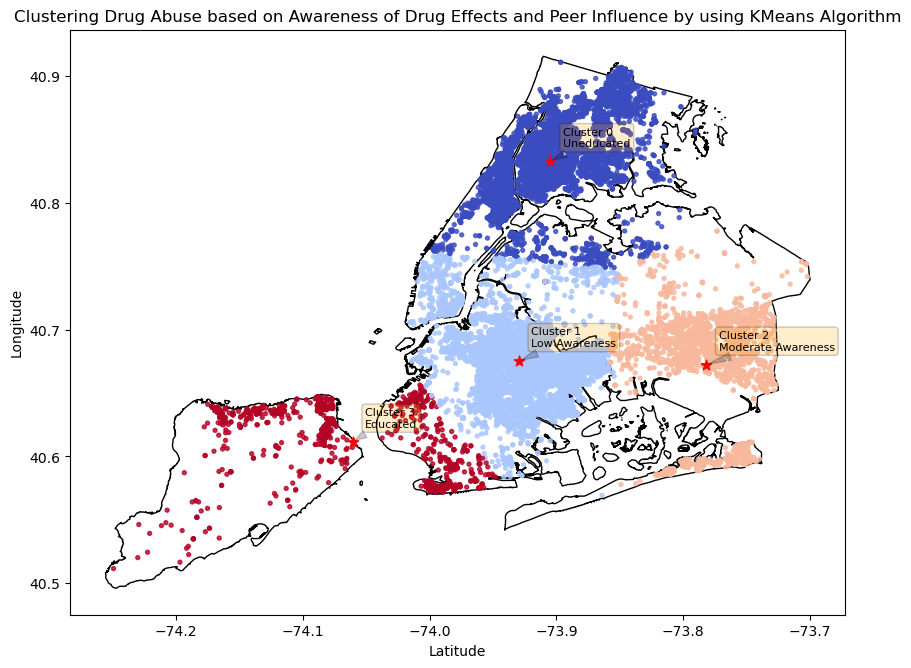

In [25]:
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Assuming purified_data is defined
purified_data['OCCUR_DATE'] = pd.to_datetime(purified_data['OCCUR_DATE'], format='%m/%d/%Y')
purified_data['Year'] = purified_data['OCCUR_DATE'].dt.year

clustering_data = purified_data.iloc[:, 3:]
clustering_data['BORO'] = clustering_data['BORO'].str.lower()
clustering_data['BORO'] = clustering_data['BORO'].astype('category').cat.codes

# Drop non-numeric columns
df_numeric = clustering_data.select_dtypes(include=['number'])

# Replace NaN values with the mean of each column
imputer = SimpleImputer(strategy='mean')
df_numeric_imputed = pd.DataFrame(imputer.fit_transform(df_numeric), columns=df_numeric.columns)

def kMeansClustering(K, df):
    try:
        # Try running KMeans without threadpool control
        model = KMeans(n_clusters=K, random_state=0).fit(df)
    except AttributeError:
        # If AttributeError occurs, try running KMeans without threadpool control again
        import threadpoolctl
        with threadpoolctl.threadpool_limits(limits=1, user_api="blas"):
            model = KMeans(n_clusters=K, random_state=0).fit(df)

    labels = pd.Series(model.labels_, name='label')
    drug_abuse_clusters = df.join(labels.to_frame())

    # Assuming 'Longitude' and 'Latitude' are your spatial columns
    drug_abuse_cluster_centroids = drug_abuse_clusters.groupby('label').mean()

    gdf_centroids = gpd.GeoDataFrame(geometry=gpd.points_from_xy(drug_abuse_cluster_centroids['Longitude'], drug_abuse_cluster_centroids['Latitude']))

    gdf = gpd.GeoDataFrame(drug_abuse_clusters, geometry=gpd.points_from_xy(drug_abuse_clusters['Longitude'], drug_abuse_clusters['Latitude']))

    fig, ax = plt.subplots(figsize=(10, 10))
    # Assuming NYC_map is defined in your code
    NYC_map.plot(ax=ax, edgecolor='black', color='white')

    # Assigning colors based on cluster characteristics
    colors = ['lightgreen', 'lightblue', 'lightcoral']
    gdf.plot(markersize=8, alpha=0.8, ax=ax, column='label', cmap=plt.cm.get_cmap('coolwarm', K))

    # Add annotations for each cluster with custom labels
    cluster_labels = ['Uneducated','Low Awareness', 'Moderate Awareness', 'Educated']
    for cluster_label, centroid, custom_label in zip(drug_abuse_cluster_centroids.index, drug_abuse_cluster_centroids.iterrows(), cluster_labels):
        plt.annotate(
            f'Cluster {cluster_label}\n{custom_label}',
            xy=(centroid[1]['Longitude'], centroid[1]['Latitude']),
            xytext=(centroid[1]['Longitude'] + 0.01, centroid[1]['Latitude'] + 0.01),
            ha='left',
            va='bottom',
            bbox=dict(boxstyle='round', alpha=0.2, facecolor='orange'),
            arrowprops=dict(facecolor='black', arrowstyle='wedge,tail_width=0.7', alpha=0.2),
            fontsize=8,
        )

    ax.set_title("Clustering Drug Abuse based on Awareness of Drug Effects and Peer Influence by using KMeans Algorithm")
    ax.set_xlabel("Latitude")
    ax.set_ylabel("Longitude")

    # Check if there is a legend before attempting to remove it
    if ax.get_legend():
        ax.get_legend().remove()  # Remove the color sidebar

    gdf_centroids.plot(ax=ax, color='red', alpha=1, marker='*', markersize=60)

    plt.show()

# Continue with the mapping
kMeansClustering(4, df_numeric_imputed)


## **B. Agglomerative Clustering**

This code snippet conducts a clustering analysis using the Agglomerative Clustering algorithm to discern patterns in drug abuse based on mental health diagnoses. The data preprocessing involves converting the 'OCCUR_DATE' to a datetime format and extracting the 'Year' for temporal analysis. The 'BORO' column is standardized through lowercase conversion and label encoding. Non-numeric columns are excluded, and missing values are imputed with the mean. The Agglomerative Clustering algorithm is then applied with K set to 3, categorizing data points based on shared characteristics related to mental health diagnoses.

Following the clustering, the code generates a spatial visualization to represent the clustered data on a map. Each cluster is assigned a unique color, offering insights into the geographical distribution of drug abuse patterns associated with mental health. Additionally, the map is enriched with annotations for each cluster centroid, providing information on mental health cases and stress levels. This visualization aids in identifying localized trends related to mental health issues, supporting targeted interventions by policymakers and healthcare professionals to address drug abuse concerns effectively.

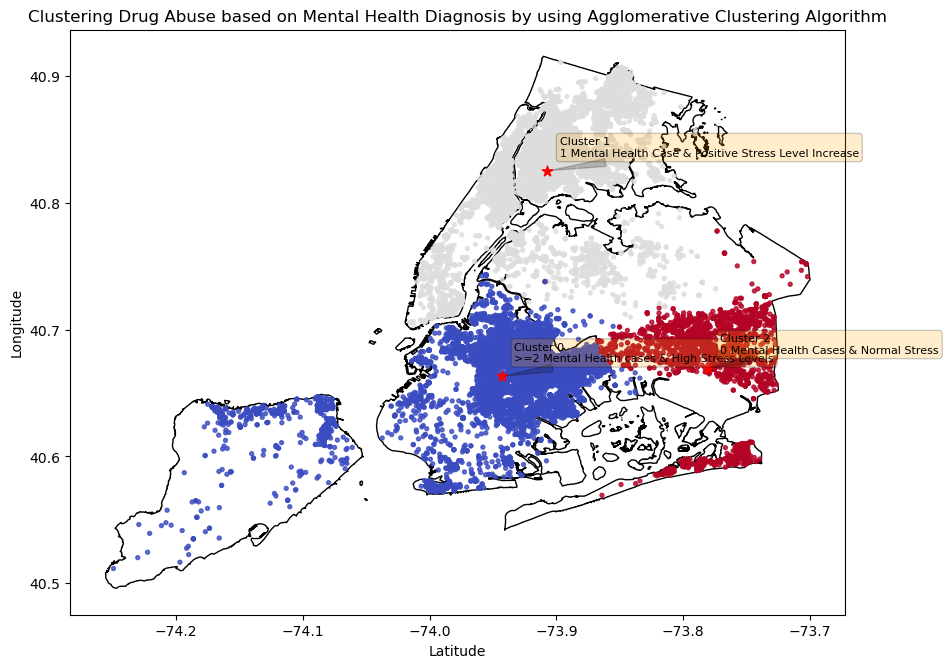

In [26]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.impute import SimpleImputer
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Assuming purified_data is defined
purified_data['OCCUR_DATE'] = pd.to_datetime(purified_data['OCCUR_DATE'], format='%m/%d/%Y')
purified_data['Year'] = purified_data['OCCUR_DATE'].dt.year

clustering_data = purified_data.iloc[:, 3:]
clustering_data['BORO'] = clustering_data['BORO'].str.lower()
clustering_data['BORO'] = clustering_data['BORO'].astype('category').cat.codes

# Drop non-numeric columns
df_numeric = clustering_data.select_dtypes(include=['number'])

# Replace NaN values with the mean of each column
imputer = SimpleImputer(strategy='mean')
df_numeric_imputed = pd.DataFrame(imputer.fit_transform(df_numeric), columns=df_numeric.columns)

def agglomerativeClustering(K, df):
    model = AgglomerativeClustering(n_clusters=K).fit(df)

    labels = pd.Series(model.labels_, name='label')
    drug_abuse_clusters = df.join(labels.to_frame())

    # Assuming 'Longitude' and 'Latitude' are your spatial columns
    drug_abuse_cluster_centroids = drug_abuse_clusters.groupby('label').mean()

    gdf_centroids = gpd.GeoDataFrame(geometry=gpd.points_from_xy(drug_abuse_cluster_centroids['Longitude'], drug_abuse_cluster_centroids['Latitude']))

    gdf = gpd.GeoDataFrame(drug_abuse_clusters, geometry=gpd.points_from_xy(drug_abuse_clusters['Longitude'], drug_abuse_clusters['Latitude']))

    fig, ax = plt.subplots(figsize=(10, 10))
    # Assuming NYC_map is defined in your code
    NYC_map.plot(ax=ax, edgecolor='black', color='white')

    # Assigning colors based on cluster characteristics
    colors = ['lightgreen', 'lightblue', 'lightcoral']
    gdf.plot(markersize=8, alpha=0.8, ax=ax, column='label', cmap=plt.cm.get_cmap('coolwarm', K))

    # Add annotations for each cluster with custom labels
    cluster_labels = ['>=2 Mental Health cases & High Stress Levels', '1 Mental Health Case & Positive Stress Level Increase', '0 Mental Health Cases & Normal Stress']
    for cluster_label, centroid, custom_label in zip(drug_abuse_cluster_centroids.index, drug_abuse_cluster_centroids.iterrows(), cluster_labels):
        plt.annotate(
            f'Cluster {cluster_label}\n{custom_label}',
            xy=(centroid[1]['Longitude'], centroid[1]['Latitude']),
            xytext=(centroid[1]['Longitude'] + 0.01, centroid[1]['Latitude'] + 0.01),
            ha='left',
            va='bottom',
            bbox=dict(boxstyle='round', alpha=0.2, facecolor='orange'),
            arrowprops=dict(facecolor='black', arrowstyle='wedge,tail_width=0.7', alpha=0.2),
            fontsize=8,
        )

    ax.set_title("Clustering Drug Abuse based on Mental Health Diagnosis by using Agglomerative Clustering Algorithm")
    ax.set_xlabel("Latitude")
    ax.set_ylabel("Longitude")

    # Check if there is a legend before attempting to remove it
    if ax.get_legend():
        ax.get_legend().remove()  # Remove the color sidebar

    gdf_centroids.plot(ax=ax, color='red', alpha=1, marker='*', markersize=60)

    plt.show()

# Continue with the mapping
agglomerativeClustering(3, df_numeric_imputed)


## C. Insights from our Analysis

In [27]:
import pandas as pd
import plotly.express as px

# Assuming purified_data is defined
purified_data['OCCUR_DATE'] = pd.to_datetime(purified_data['OCCUR_DATE'], format='%Y-%m-%d')

# Extract month and create a new column
purified_data['Month'] = purified_data['OCCUR_DATE'].dt.month

# Create a new column 'Season' based on the month
season_dict = {1: 'Winter', 2: 'Winter', 3: 'Spring', 4: 'Spring', 5: 'Spring', 6: 'Summer',
               7: 'Summer', 8: 'Summer', 9: 'Fall', 10: 'Fall', 11: 'Fall', 12: 'Winter'}
purified_data['Season'] = purified_data['Month'].map(season_dict)

# Group by 'Season' and calculate the average drug abuse incidents per day
average_incidents = purified_data.groupby('Season')['OCCUR_DATE'].count() / purified_data['OCCUR_DATE'].dt.date.nunique()

# Create a Plotly bar chart
fig = px.bar(
    x=average_incidents.index,
    y=average_incidents.values,
    color=average_incidents.index,
    labels={'x': 'Season', 'y': 'Average Incidents per Day'},
    title='Average Drug Abuse Incidents per Day Based on Seasons',
)

# Update the layout for better aesthetics
fig.update_layout(
    xaxis=dict(tickmode='array', tickvals=[0, 1, 2, 3], ticktext=average_incidents.index),
    showlegend=False,  # Hide legend
    yaxis_title='Average Incidents per Day',
    xaxis_title='Season',
    title_x=0.5,  # Center the title
)

# Show the plot
fig.show()


In [28]:
import pandas as pd
import plotly.express as px


# Assuming purified_data is defined
purified_data['OCCUR_DATE'] = pd.to_datetime(purified_data['OCCUR_DATE'], format='%Y-%m-%d')

# Extract month and create a new column
purified_data['Month'] = purified_data['OCCUR_DATE'].dt.month

# Create a new column 'Season' based on the month
season_dict = {1: 'Winter', 2: 'Winter', 3: 'Spring', 4: 'Spring', 5: 'Spring', 6: 'Summer',
               7: 'Summer', 8: 'Summer', 9: 'Fall', 10: 'Fall', 11: 'Fall', 12: 'Winter'}
purified_data['Season'] = purified_data['Month'].map(season_dict)

# Extract hour from 'OCCUR_TIME'
purified_data['Hour'] = pd.to_datetime(purified_data['OCCUR_TIME'], format='%H:%M:%S').dt.hour

# Group by 'Hour' and calculate the average drug abuse incidents per day for each season
season_average = purified_data.groupby(['Season', 'Hour']).size().reset_index(name='Average Incidents')

# Create a Plotly bar chart
fig = px.bar(
    season_average,
    x='Hour',
    y='Average Incidents',
    color='Season',
    labels={'x': 'Hour of the Day', 'y': 'Average Incidents'},
    title='Average Drug Abuse Incidents in a Day (Time vs Incident) - All Seasons',
    height=600,
    width=800,
)

# Show the plot
fig.show()


In [29]:
from sklearn.metrics import silhouette_score

def calculate_silhouette_score(df, max_clusters):
    silhouette_scores = []

    for k in range(2, max_clusters + 1):
        model = AgglomerativeClustering(n_clusters=k).fit(df)
        labels = model.labels_
        silhouette_avg = silhouette_score(df, labels)
        silhouette_scores.append(silhouette_avg)
        print(f"Silhouette Score for {k} clusters: {silhouette_avg}")

    return silhouette_scores

# Assuming df_numeric_imputed is your numeric data after imputation
max_clusters_to_try = 10  # You can adjust this based on your preferences
silhouette_scores = calculate_silhouette_score(df_numeric_imputed, max_clusters_to_try)

Silhouette Score for 2 clusters: 0.5848675617965438
Silhouette Score for 3 clusters: 0.5920015806304297
Silhouette Score for 4 clusters: 0.601531775484761
Silhouette Score for 5 clusters: 0.4754248510141635
Silhouette Score for 6 clusters: 0.46393899828758167
Silhouette Score for 7 clusters: 0.42078681824838626
Silhouette Score for 8 clusters: 0.4318599269153144
Silhouette Score for 9 clusters: 0.4068245489481486
Silhouette Score for 10 clusters: 0.4146328667804528
